In [1]:
import os
print("Current_Working_Directory:", os.getcwd())

In [2]:
directory_path = "C:/Users/viraj/Code_a/Machine_learning/Decision_tree"
contents = os.listdir(directory_path)
print("Contents")
for i in contents:
    print(i)

In [3]:
#Import the Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
#reading the File
df=pd.read_csv("C:/Users/viraj/Code_a/Machine_learning/Decision_tree/penguins_size.csv") 

In [5]:
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [6]:
df.shape

(344, 7)

In [7]:
df.describe()

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g
count,342.000000,342.000000,342.000000,342.000000
mean,43.921930,17.151170,200.915205,4201.754386
std,5.459584,1.974793,14.061714,801.954536
min,32.100000,13.100000,172.000000,2700.000000
25%,39.225000,15.600000,190.000000,3550.000000
50%,44.450000,17.300000,197.000000,4050.000000
75%,48.500000,18.700000,213.000000,4750.000000
max,59.600000,21.500000,231.000000,6300.000000


In [8]:
df.dtypes

species               object
island                object
culmen_length_mm     float64
culmen_depth_mm      float64
flipper_length_mm    float64
body_mass_g          float64
sex                   object
dtype: object

In [9]:
#calculating the null Values
df.isnull().sum()

species               0
island                0
culmen_length_mm      2
culmen_depth_mm       2
flipper_length_mm     2
body_mass_g           2
sex                  10
dtype: int64

In [10]:
#checking what percent of data is been missing
df.isnull().sum()/len(df)*100

species              0.000000
island               0.000000
culmen_length_mm     0.581395
culmen_depth_mm      0.581395
flipper_length_mm    0.581395
body_mass_g          0.581395
sex                  2.906977
dtype: float64

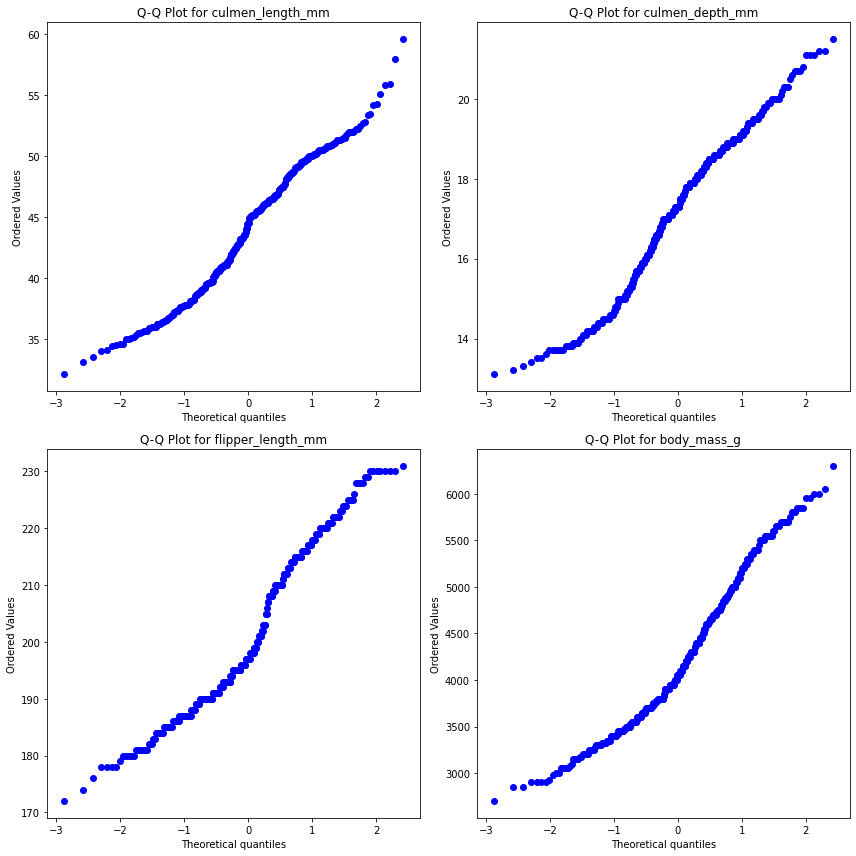

In [11]:
#Checking whether the data is Normally distributed using QQ plot
import scipy.stats as stats
columns = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm','body_mass_g']
num_rows=2
# Subplots for QQ plot
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
if num_rows > 1:
    axes = axes.flatten()
#Plot Q-Q plot
for i, column in enumerate(columns):
    stats.probplot(df[column], dist="norm", plot=axes[i])
    axes[i].set_title(f'Q-Q Plot for {column}')

plt.tight_layout()
plt.show()

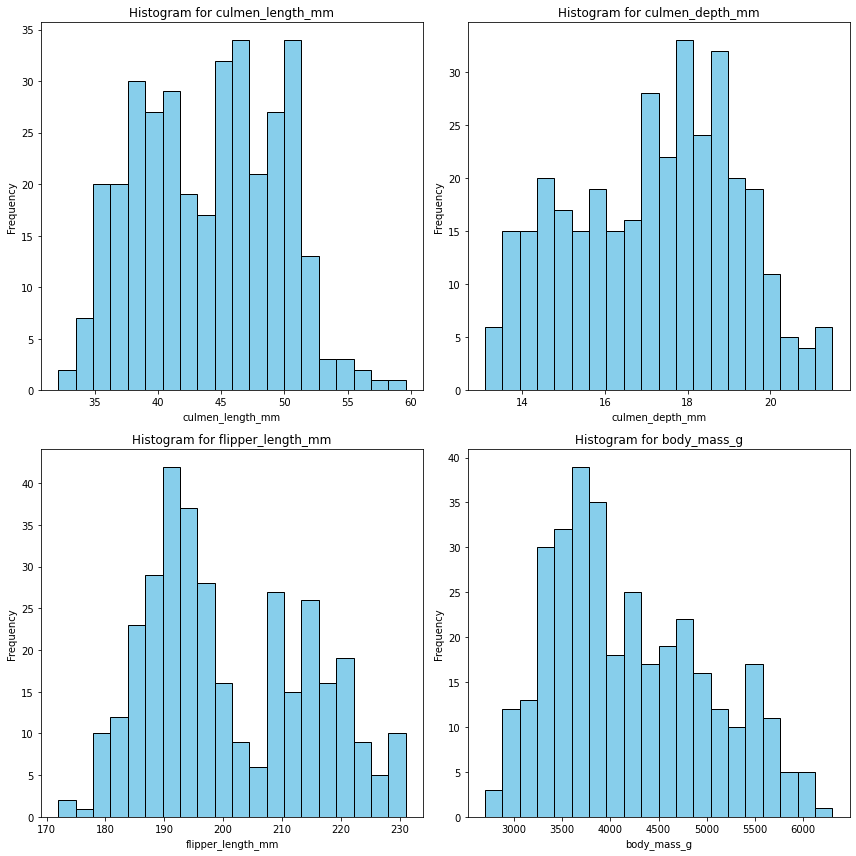

In [12]:
import matplotlib.pyplot as plt

# Columns to plot
columns = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g']
fig, axes = plt.subplots(2, 2, figsize=(12,12))
if num_rows > 1:
    axes = axes.flatten()
#plot histogram
for i, column in enumerate(columns):
    ax = axes[i]
    ax.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram for {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
plt.tight_layout()
plt.show()

Given that the majority of our data seems to follow a normal distribution, except for 'body_mass_g' which has a higher standard deviation, opting to fill in the missing values using the median method sounds like a sensible choice. By using the median, we can handle any potential outliers in 'body_mass_g' without being overly influenced by extreme values. This approach ensures that our data remains representative and maintains its integrity throughout the preprocessing stage, setting us up for more accurate and reliable modeling results.

Even though decision trees can handle various data distributions without much fuss, it's still a smart move to check out how our data looks before diving into machine learning. Taking a peek at the distribution helps us understand our data better—spotting any oddities or patterns lurking within. Plus, it guides us on whether we need to tidy things up a bit before feeding it to our models. Whether we're dealing with outliers or need to transform features, having this insight upfront can make our modeling journey smoother and our results more reliable. So, it's kind of like giving our data a friendly hello before we embark on our machine learning adventure!

In [13]:
columns = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g']

# Fill NaN or null values with median for each column
for column in columns:
    median = df[column].median()
    df[column].fillna(median, inplace=True)

In [14]:
df.dropna(subset=['sex'], inplace=True)

In [15]:
df.isnull().sum()

species              0
island               0
culmen_length_mm     0
culmen_depth_mm      0
flipper_length_mm    0
body_mass_g          0
sex                  0
dtype: int64

In [16]:
df.shape

(334, 7)

In [17]:
df['species'].unique() #checking all Unique values

array(['Adelie', 'Chinstrap', 'Gentoo'], dtype=object)

In [18]:
df['island'].unique()  #checking all Unique values

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [19]:
df['sex'].unique() #checking all Unique values

array(['MALE', 'FEMALE', '.'], dtype=object)

In [20]:
df[df['sex']=='.'] 

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
336,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,.


In [21]:
#one Hot Encoding
df_encoded = pd.get_dummies(df, columns=['species', 'island'], dtype=int)

One-hot encoding is crucial for Our model as it transforms categorical variables into a numerical format that the algorithm can understand, ensuring each category is treated distinctly. This conversion preserves the unique information of each category, preventing misinterpretation and improving model performance by enabling more accurate splits and decisions based on the presence or absence of specific categories.

In [22]:
mask = df_encoded['sex'] != '.'
df_encoded = df_encoded[mask]

In [23]:
sex_mapping = {'MALE': 1, 'FEMALE': 0}
df_encoded['sex'] = df_encoded['sex'].str.upper().map(sex_mapping)

In [24]:
df_encoded

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex,species_Adelie,species_Chinstrap,species_Gentoo,island_Biscoe,island_Dream,island_Torgersen
0,39.1,18.7,181.0,3750.0,1,1,0,0,0,0,1
1,39.5,17.4,186.0,3800.0,0,1,0,0,0,0,1
2,40.3,18.0,195.0,3250.0,0,1,0,0,0,0,1
4,36.7,19.3,193.0,3450.0,0,1,0,0,0,0,1
5,39.3,20.6,190.0,3650.0,1,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
338,47.2,13.7,214.0,4925.0,0,0,0,1,1,0,0
340,46.8,14.3,215.0,4850.0,0,0,0,1,1,0,0
341,50.4,15.7,222.0,5750.0,1,0,0,1,1,0,0
342,45.2,14.8,212.0,5200.0,0,0,0,1,1,0,0


In [25]:
df_encoded.describe()

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex,species_Adelie,species_Chinstrap,species_Gentoo,island_Biscoe,island_Dream,island_Torgersen
count,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000
mean,43.992793,17.164865,200.966967,4207.057057,0.504505,0.438438,0.204204,0.357357,0.489489,0.369369,0.141141
std,5.468668,1.969235,14.015765,805.215802,0.500732,0.496942,0.403726,0.479942,0.500642,0.483360,0.348691
min,32.100000,13.100000,172.000000,2700.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,39.500000,15.600000,190.000000,3550.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,44.500000,17.300000,197.000000,4050.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,48.600000,18.700000,213.000000,4775.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000
max,59.600000,21.500000,231.000000,6300.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


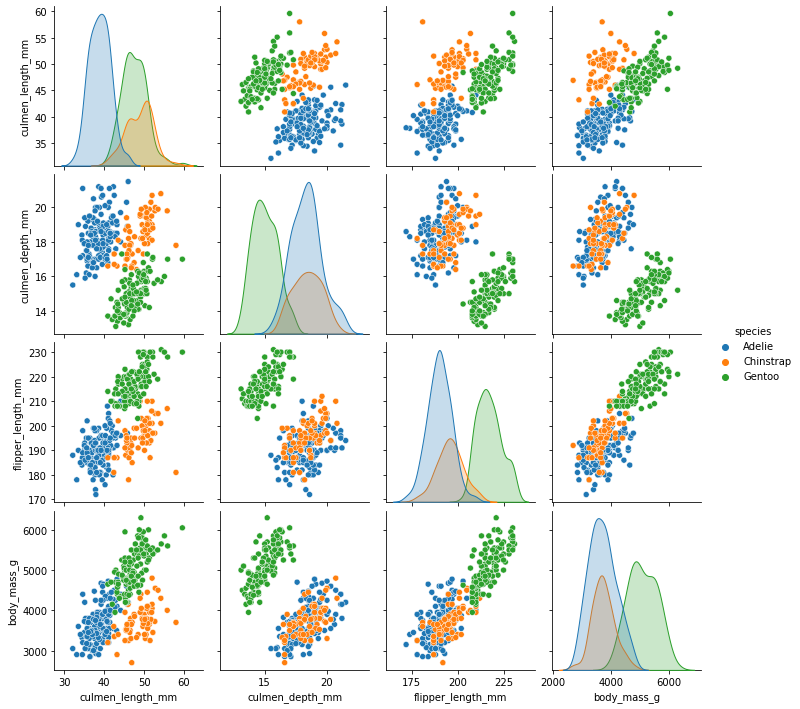

In [26]:
#With the pairplot, we can clearly observe the distinct characteristics of all three species.
sns.pairplot(df,hue='species')

In [27]:
#We can see that All three spices can be catgorize quite separatly.

In [28]:
df_encoded.columns

Index(['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm',
       'body_mass_g', 'sex', 'species_Adelie', 'species_Chinstrap',
       'species_Gentoo', 'island_Biscoe', 'island_Dream', 'island_Torgersen'],
      dtype='object')

In [29]:
X = df_encoded.drop('sex', axis=1)  # Features
y = df_encoded['sex']  # Target variable

In [30]:
#using Random Forest For Feature Importance
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X, y)
# Get feature importances
feature_importances = pd.DataFrame(rf_classifier.feature_importances_, index=X.columns, columns=['Importance'])
print(feature_importances.sort_values(by='Importance', ascending=False))

                   Importance
body_mass_g          0.317741
culmen_depth_mm      0.302764
culmen_length_mm     0.189993
flipper_length_mm    0.110595
species_Adelie       0.022972
species_Gentoo       0.020259
island_Biscoe        0.011178
species_Chinstrap    0.011084
island_Dream         0.008724
island_Torgersen     0.004691


<AxesSubplot:>

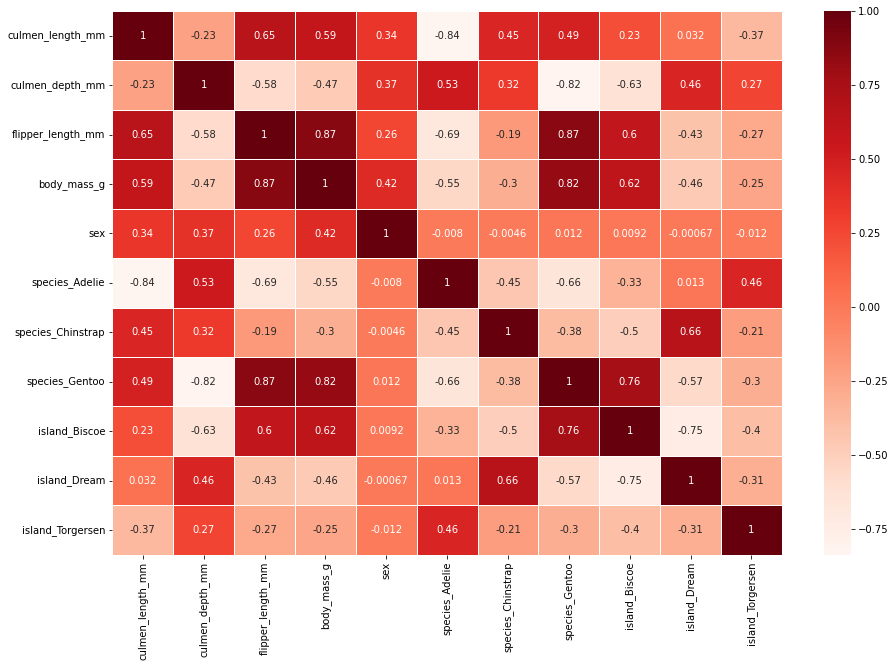

In [31]:
plt.figure(figsize=(15,10))
sns.heatmap(df_encoded.corr(), annot=True,linewidths=0.5, cmap="Reds")

### Train Test Split

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score


In [33]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [34]:
### Decision Tree Classifier

In [35]:
%%time
model=DecisionTreeClassifier() #itiatie the model 
model.fit(X_train,y_train) #fit the Model
predic=model.predict(X_test)  #Make predictions on the testing data
accuracy = accuracy_score(y_test, predic) #And calculate the model
print("Accuracy:", accuracy)

Accuracy: 0.8507462686567164
CPU times: total: 0 ns
Wall time: 5.39 ms


In [36]:
class_without_parameter=classification_report(y_test,predic)
print(class_without_parameter)

              precision    recall  f1-score   support

           0       0.85      0.89      0.87        37
           1       0.86      0.80      0.83        30

    accuracy                           0.85        67
   macro avg       0.85      0.85      0.85        67
weighted avg       0.85      0.85      0.85        67



In [37]:
confustion_without_para=confusion_matrix(y_test,predic)
confustion_without_para

array([[33,  4],
       [ 6, 24]], dtype=int64)

In [38]:
#here we are doing feature Importance using our Model
pd.DataFrame(index=X.columns,data=model.feature_importances_,columns=['Feature Importance']).sort_values('Feature Importance')       

,Feature Importance
species_Adelie,0.000000
species_Gentoo,0.000000
island_Biscoe,0.000000
island_Torgersen,0.000000
species_Chinstrap,0.002866
island_Dream,0.010039
flipper_length_mm,0.037325
culmen_length_mm,0.097095
body_mass_g,0.383501
culmen_depth_mm,0.469174


### Now Lets Start Hyperparamter Tuning for Decion Trees

In [39]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix, classification_report
import warnings

In [40]:
param_grid = {
    'criterion': ['gini', 'entropy','log_loss'], # for our during Grid search its probably it would use Gini
    'splitter': ['best', 'random'], #default is 'best' 
    'max_depth': [None, 5, 10, 15,20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

So lets talk about The Hyperparamter<b>`"Criterion"`</b> ,<br></br>
**'Gini':**  Works well for datasets with categorical variables or imbalanced classes, measuring the probability of misclassification based on the distribution of labels in a node. Faster to compute compared to entropy.
   
**'entropy':** Entropy, or information gain, measures the amount of uncertainty or disorder in the dataset. It's like asking how much additional information we gain by splitting the data at a particular node. Entropy is useful for datasets with attributes having many possible values or continuous variables, and it helps create more balanced decision trees.

**'log_loss':** Primarily used in binary or multiclass classification with probability predictions, assessing the accuracy of classifier by comparing predicted probabilities to actual class labels. Useful for optimizing probability estimates, especially in scenarios where prediction confidence is crucial.
______________________________________________
Now the Hyperparamter<b>`"splitter"`</b><br></br>
**'best':**"Best" is preferred as it ensures the highest quality of the split, making it suitable for most scenarios.

**'random':**"Random" is useful when you want to introduce randomness into the decision-making process, which may help prevent overfitting in certain cases or when dealing with very high-dimensional data.
______________________________________________
The Hyperparamter<b>`"max_depth"`</b><br></br>
The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
_______________________________________________
The Hyperparamter<b>`"min_samples_split"`</b><br></br>
The `min_samples_split` parameter in decision trees specifies the minimum number of samples required at a node for it to be split further. Increasing this value results in simpler trees with fewer nodes, reducing overfitting. Conversely, decreasing it allows for more splits, potentially capturing more intricate patterns but increasing the risk of overfitting. Therefore, finding the optimal value for `min_samples_split` is crucial for balancing model complexity and generalization.
__________________________________________________
The Hyperparamter<b>`"max_features"`</b><br></br>
**'auto':** This option considers all features, making it suitable for most scenarios. It allows the model to evaluate all possible splits based on all available features.

**'sqrt':** It considers the square root of the total number of features. This option is often a good choice when dealing with a large number of features, as it prevents the model from being too sensitive to individual features and helps control model complexity.

**'log2':** This option considers the logarithm base 2 of the total number of features. Similar to 'sqrt', it helps limit the number of features considered and can be effective for reducing overfitting, particularly in high-dimensional datasets.

In [41]:
%%time
# Ignore all warnings
warnings.filterwarnings("ignore")
dt_classifier = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=10, scoring='accuracy')
grid_search.fit(X, y)

CPU times: total: 23.3 s
Wall time: 24.1 s


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [None, 5, 10, 15, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [42]:
print("Best parameters:", grid_search.best_params_)
print("Best accuracy:", grid_search.best_score_)

Best parameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'splitter': 'random'}
Best accuracy: 0.8740641711229946


In [43]:
# Fit the decision tree classifier with the best parameters found from grid search
best_dt_classifier = grid_search.best_estimator_
best_dt_classifier.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = best_dt_classifier.predict(X_test)

# Create the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[31  6]
 [ 2 28]]


In [44]:
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.84      0.89        37
           1       0.82      0.93      0.87        30

    accuracy                           0.88        67
   macro avg       0.88      0.89      0.88        67
weighted avg       0.89      0.88      0.88        67



In [45]:
conf_matrix  # with hyperparamters

array([[31,  6],
       [ 2, 28]], dtype=int64)

In [46]:
confustion_without_para ## without hyperparamters

array([[33,  4],
       [ 6, 24]], dtype=int64)

In [47]:
# With hyperparameters
TP_hyper = conf_matrix[0, 0]
FP_hyper = conf_matrix[0, 1]
TN_hyper = conf_matrix[1, 1]
FN_hyper = conf_matrix[1, 0]

accuracy_hyper = (TP_hyper + TN_hyper) / (TP_hyper + TN_hyper + FP_hyper + FN_hyper)

precision_1_hyper = TP_hyper / (TP_hyper + FP_hyper)
precision_0_hyper = TN_hyper / (TN_hyper + FN_hyper)

recall_0_hyper = TN_hyper / (TN_hyper + FP_hyper)  
recall_1_hyper = TP_hyper / (TP_hyper + FN_hyper)

f1_score_1_hyper = 2 * (precision_1_hyper * recall_1_hyper) / (precision_1_hyper + recall_1_hyper)
f1_score_0_hyper = 2 * (precision_0_hyper * recall_0_hyper) / (precision_0_hyper + recall_0_hyper)


# Without hyperparameters
TP_without_hyper = confustion_without_para[0, 0]
FP_without_hyper = confustion_without_para[0, 1]
TN_without_hyper = confustion_without_para[1, 1]
FN_without_hyper = confustion_without_para[1, 0]

accuracy_without_hyper = (TP_without_hyper + TN_without_hyper) / (TP_without_hyper + TN_without_hyper + FP_without_hyper + FN_without_hyper)

precision_0_without_hyper = TN_without_hyper / (TN_without_hyper + FN_without_hyper)
precision_1_without_hyper = TP_without_hyper / (TP_without_hyper + FP_without_hyper)

recall_0_without_hyper = TN_without_hyper / (TN_without_hyper + FP_without_hyper) 
recall_1_without_hyper = TP_without_hyper / (TP_without_hyper + FN_without_hyper)

f1_score_1_without_hyper = 2 * (precision_1_without_hyper * recall_1_without_hyper) / (precision_1_without_hyper + recall_1_without_hyper)
f1_score_0_without_hyper = 2 * (precision_0_without_hyper * recall_0_without_hyper) / (precision_0_without_hyper + recall_0_without_hyper)


# Print the results
print("With hyperparameters>:\n")
print(f"True positives (TP) = {TP_hyper}\n"
      f"False positives (FP) = {FP_hyper}\n"
      f"True negatives (TN) = {TN_hyper}\n"
      f"False negatives (FN) = {FN_hyper}\n"
      f"Accuracy: {accuracy_hyper:.0%}\n"
      
         f"Precision (Class 0): {precision_0_hyper:.0%}\n"
       f"Precision (Class 1): {precision_1_hyper:.0%}\n"
   
          f"Recall (Class 0): {recall_0_hyper:.0%}\n"
            f"Recall (Class 1): {recall_1_hyper:.0%}\n"
  
      f"F1-score (Class 0): {f1_score_0_hyper:.0%}\n"
      f"F1-score (Class 1): {f1_score_1_hyper:.0%}\n\n\n"
    
      )

print("Without hyperparameters:\n")
print(f"True positives (TP) = {TP_without_hyper}\n"
      f"False positives (FP) = {FP_without_hyper}\n"
      f"True negatives (TN) = {TN_without_hyper}\n"
      f"False negatives (FN) = {FN_without_hyper}\n"
      f"Accuracy: {accuracy_without_hyper:.0%}\n"
      
           f"Precision (Class 0): {precision_0_without_hyper:.0%}\n"
      f"Precision (Class 1): {precision_1_without_hyper:.0%}\n"
 
      f"Recall (Class 0): {recall_0_without_hyper:.0%}\n"
       f"Recall (Class 1): {recall_1_without_hyper:.0%}\n"
      
       f"F1-score (Class 0): {f1_score_0_without_hyper:.0%}\n"
       f"F1-score (Class 1): {f1_score_1_without_hyper:.0%}\n"
     
      )


With hyperparameters>:

True positives (TP) = 31
False positives (FP) = 6
True negatives (TN) = 28
False negatives (FN) = 2
Accuracy: 88%
Precision (Class 0): 93%
Precision (Class 1): 84%
Recall (Class 0): 82%
Recall (Class 1): 94%
F1-score (Class 0): 87%
F1-score (Class 1): 89%



Without hyperparameters:

True positives (TP) = 33
False positives (FP) = 4
True negatives (TN) = 24
False negatives (FN) = 6
Accuracy: 85%
Precision (Class 0): 80%
Precision (Class 1): 89%
Recall (Class 0): 86%
Recall (Class 1): 85%
F1-score (Class 0): 83%
F1-score (Class 1): 87%



Considering accuracy, precision, recall, and F1-score, the model with hyperparameters generally performs better, with higher values for most metrics..

In [48]:
print(class_report)

              precision    recall  f1-score   support

           0       0.94      0.84      0.89        37
           1       0.82      0.93      0.87        30

    accuracy                           0.88        67
   macro avg       0.88      0.89      0.88        67
weighted avg       0.89      0.88      0.88        67



In [49]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Plot the decision tree
plt.figure(figsize=(100,50), dpi=300)
plot_tree(best_dt_classifier, feature_names=X.columns, class_names=['female', 'male'], filled=True)
plt.show()

In [50]:
plt.figure(figsize=(100,60), dpi=300)
plot_tree(best_dt_classifier, feature_names=X.columns, class_names=['female', 'male'], filled=True)
plt.savefig('C:/Users/viraj/Code_a/Machine_learning/Decision_tree/decision_tree12.png')  # Save the figure to a file
plt.close()  # Close the figure to free memory


In [51]:
plt.figure(figsize=(50,50), dpi=300)
plot_tree(best_dt_classifier,feature_names=X.columns,class_names=['female', 'male'],filled=True)

[Text(0.6208333333333333, 0.9642857142857143, 'island_Dream <= 0.727\ngini = 0.499\nsamples = 266\nvalue = [128, 138]\nclass = male'),
 Text(0.4083333333333333, 0.8928571428571429, 'species_Gentoo <= 0.94\ngini = 0.5\nsamples = 163\nvalue = [80, 83]\nclass = male'),
 Text(0.3, 0.8214285714285714, 'culmen_depth_mm <= 19.867\ngini = 0.5\nsamples = 67\nvalue = [34, 33]\nclass = female'),
 Text(0.26666666666666666, 0.75, 'culmen_length_mm <= 42.409\ngini = 0.488\nsamples = 59\nvalue = [34, 25]\nclass = female'),
 Text(0.23333333333333334, 0.6785714285714286, 'culmen_length_mm <= 41.283\ngini = 0.466\nsamples = 54\nvalue = [34, 20]\nclass = female'),
 Text(0.2, 0.6071428571428571, 'body_mass_g <= 3984.863\ngini = 0.413\nsamples = 48\nvalue = [34, 14]\nclass = female'),
 Text(0.16666666666666666, 0.5357142857142857, 'culmen_depth_mm <= 18.162\ngini = 0.369\nsamples = 45\nvalue = [34, 11]\nclass = female'),
 Text(0.1, 0.4642857142857143, 'island_Torgersen <= 0.198\ngini = 0.133\nsamples = 28\